# SPLEX-Project 2020-2021 : Frog Calls 
-------
## 🐸 Step 1 : Visualisation of the dataset 🐸
#### *Adrien Leroy and Antoine Auvergne*

In [2]:
import numpy as np
import pandas as pd 
import matplotlib.pyplot as plt
import librosa
import IPython.display as ipd
from scipy.io.wavfile import write
import chart_studio.plotly as py
from plotly.graph_objs import *
import plotly.express as px
import nbformat

### A-Description of the dataset

 * Acoustic features extracted from syllables of anuran (frogs) calls, including the family, the genus, and the species labels. 
 
 * Number of instances : 7195
 * Number of features : 22
 * **3 Labels :**

| Families | Genus | Species |
| :-- | :--- | :--- |
| Dendrobatidae | Adenomera | AdenomeraAndre |
| Hylidae | Ameerega | AdenomeraHylaedact |
| Leptodactylidae | Dendropsophus | ScinaxRuber |
| Bufonidae| Hypsiboas| Ameeregatrivittata |
| | Leptodactylus | HylaMinuta |
| | Osteocephalus | HypsiboasCinerascens |
| | Rhinella |HypsiboasCordobae |
| | Scinax| LeptodactylusFuscus |
| | | OsteocephalusOopha |
| | | Rhinellagranulosa |



#### Key variables

In [3]:
dataset=pd.read_csv('../anuran_calls/Frogs_MFCCs.csv')
features=dataset.columns[:-4]
labels=dataset.columns[-4:]

#### Basic infos

In [4]:
display(dataset)
print(features)
print(labels)
print(np.unique(dataset[labels[2]]))

,MFCCs_ 1,MFCCs_ 2,MFCCs_ 3,MFCCs_ 4,MFCCs_ 5,MFCCs_ 6,MFCCs_ 7,MFCCs_ 8,MFCCs_ 9,MFCCs_10,...,MFCCs_17,MFCCs_18,MFCCs_19,MFCCs_20,MFCCs_21,MFCCs_22,Family,Genus,Species,RecordID
0,1.0,0.152936,-0.105586,0.200722,0.317201,0.260764,0.100945,-0.150063,-0.171128,0.124676,...,-0.108351,-0.077623,-0.009568,0.057684,0.118680,0.014038,Leptodactylidae,Adenomera,AdenomeraAndre,1
1,1.0,0.171534,-0.098975,0.268425,0.338672,0.268353,0.060835,-0.222475,-0.207693,0.170883,...,-0.090974,-0.056510,-0.035303,0.020140,0.082263,0.029056,Leptodactylidae,Adenomera,AdenomeraAndre,1
2,1.0,0.152317,-0.082973,0.287128,0.276014,0.189867,0.008714,-0.242234,-0.219153,0.232538,...,-0.050691,-0.023590,-0.066722,-0.025083,0.099108,0.077162,Leptodactylidae,Adenomera,AdenomeraAndre,1
3,1.0,0.224392,0.118985,0.329432,0.372088,0.361005,0.015501,-0.194347,-0.098181,0.270375,...,-0.136009,-0.177037,-0.130498,-0.054766,-0.018691,0.023954,Leptodactylidae,Adenomera,AdenomeraAndre,1
4,1.0,0.087817,-0.068345,0.306967,0.330923,0.249144,0.006884,-0.265423,-0.172700,0.266434,...,-0.048885,-0.053074,-0.088550,-0.031346,0.108610,0.079244,Leptodactylidae,Adenomera,AdenomeraAndre,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7190,1.0,-0.554504,-0.337717,0.035533,0.034511,0.443451,0.093889,-0.100753,0.037087,0.081075,...,0.069430,0.071001,0.021591,0.052449,-0.021860,-0.079860,Hylidae,Scinax,ScinaxRuber,60
7191,1.0,-0.517273,-0.370574,0.030673,0.068097,0.402890,0.096628,-0.116460,0.063727,0.089034,...,0.061127,0.068978,0.017745,0.046461,-0.015418,-0.101892,Hylidae,Scinax,ScinaxRuber,60
7192,1.0,-0.582557,-0.343237,0.029468,0.064179,0.385596,0.114905,-0.103317,0.070370,0.081317,...,0.082474,0.077771,-0.009688,0.027834,-0.000531,-0.080425,Hylidae,Scinax,ScinaxRuber,60
7193,1.0,-0.519497,-0.307553,-0.004922,0.072865,0.377131,0.086866,-0.115799,0.056979,0.089316,...,0.051796,0.069073,0.017963,0.041803,-0.027911,-0.096895,Hylidae,Scinax,ScinaxRuber,60


Index(['MFCCs_ 1', 'MFCCs_ 2', 'MFCCs_ 3', 'MFCCs_ 4', 'MFCCs_ 5', 'MFCCs_ 6',
       'MFCCs_ 7', 'MFCCs_ 8', 'MFCCs_ 9', 'MFCCs_10', 'MFCCs_11', 'MFCCs_12',
       'MFCCs_13', 'MFCCs_14', 'MFCCs_15', 'MFCCs_16', 'MFCCs_17', 'MFCCs_18',
       'MFCCs_19', 'MFCCs_20', 'MFCCs_21', 'MFCCs_22'],
      dtype='object')
Index(['Family', 'Genus', 'Species', 'RecordID'], dtype='object')
['AdenomeraAndre' 'AdenomeraHylaedactylus' 'Ameeregatrivittata'
 'HylaMinuta' 'HypsiboasCinerascens' 'HypsiboasCordobae'
 'LeptodactylusFuscus' 'OsteocephalusOophagus' 'Rhinellagranulosa'
 'ScinaxRuber']


#### Distributions of the sample

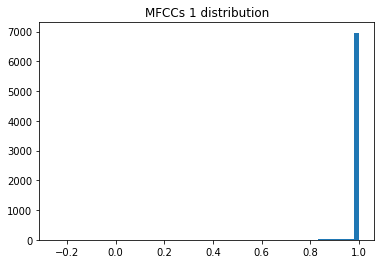

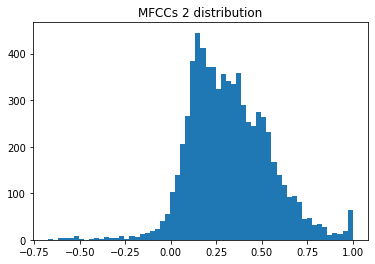

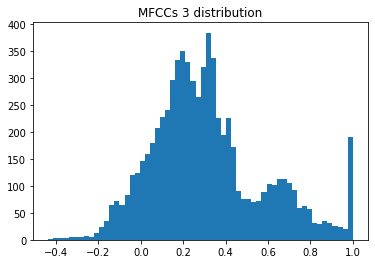

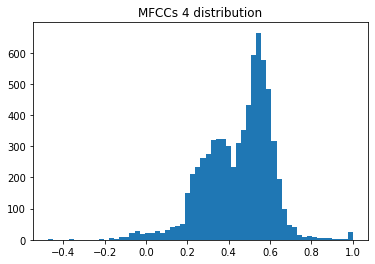

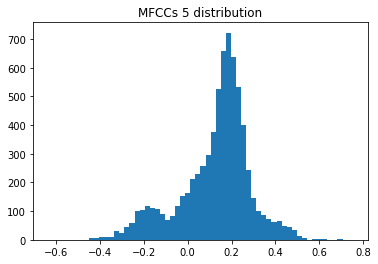

...

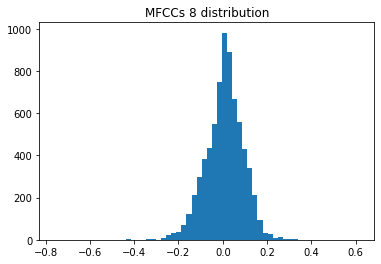

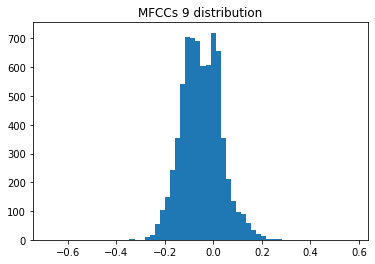

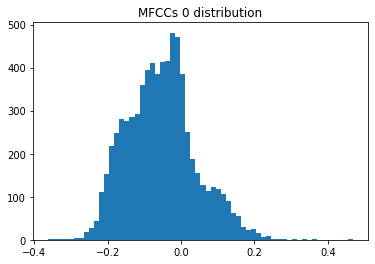

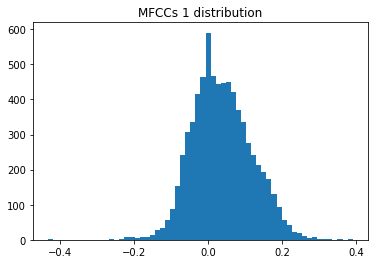

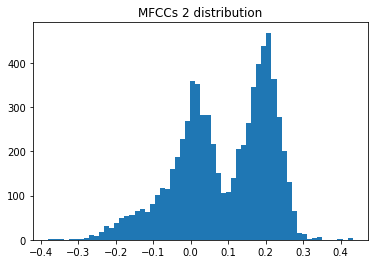

In [10]:
def CoefficientDistribution(name,values):
    plt.figure()
    plt.hist(values,bins=60)
    plt.title(name+" distribution")
    plt.show()
    pass

for feature in features:
    nom=(feature[:-3])
    numero=(feature[-1])
    name=nom+" "+numero
    CoefficientDistribution(name,dataset[feature])

#### What can we say 🐸

 1. MFCCs_1 wont be useful 
 2. Multiple normal distributions in most of the features

#### Correlation between features

In [6]:
df = px.data.iris()
datasetfeatures=dataset[features[1:]]
                    
display
fig = px.scatter_matrix(datasetfeatures,
    dimensions=datasetfeatures.columns,
    color=dataset[labels[2]],width=1200, height=1200)
fig.show()

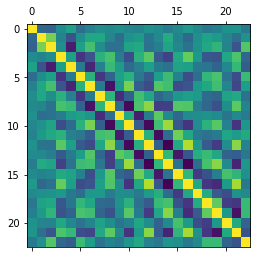

In [7]:
plt.matshow(dataset.corr())
plt.show()

#### Trying to convert files into sound 🐸
**It's really ~~bad~~ not very good**

In [10]:
MFFCs=dataset.iloc[1:,:-4].values

MFFC1=np.array([MFFCs[0,:]])
MFFC2=np.array([MFFCs[3000,:]])
MFFC3=np.array([MFFCs[6000,:]])

signal1=librosa.feature.inverse.mfcc_to_audio(MFFC1).flatten()
signal2=librosa.feature.inverse.mfcc_to_audio(MFFC2).flatten()
signal3=librosa.feature.inverse.mfcc_to_audio(MFFC3).flatten()

print("Signal n°1 !")
print(dataset.iloc[0][labels[-2]])
display(ipd.Audio(signal1, rate=41000, autoplay=False))
print("Signal n°2 ..?")
print(dataset.iloc[3000][labels[-2]])
display(ipd.Audio(signal2, rate=41000, autoplay=False))
print("Signal n°3 ...")
print(dataset.iloc[6000][labels[-2]])
display(ipd.Audio(signal3, rate=41000, autoplay=False))

Signal n°1 !
AdenomeraAndre


Signal n°2 ..?
AdenomeraHylaedactylus


Signal n°3 ...
HypsiboasCordobae



### B-References


1. COLONNA, J. G.; CRISTO, M.; SALVATIERRA, M.; NAKAMURA, E. F. 
[**An Incremental Technique for Real-Time Bioacoustic Signal Segmentation**](https://github.com/LeroyAdrien/FrogCalls/blob/main/references/j.eswa.2015.05.030.pdf)
Expert Systems with Applications, v. 42, p. 7367-7374, 2015.


2. COLONNA, J. G.; GAMA, J.; NAKAMURA, E. F.
[**How to Correctly Evaluate an Automatic Bioacoustics Classification Method**](https://www.researchgate.net/publication/304251931_How_to_Correctly_Evaluate_an_Automatic_Bioacoustics_Classification_Method) 
In: 17th Conference of the Spanish Association for Artificial Intelligence (CAEPIA). 
Lecture Notes in Computer Science. 986ed.: Springer International Publishing, 2016, v. , p. 37-47.


3. COLONNA, J. G.; GAMA, J.; NAKAMURA, E. F. 
[**Recognizing Family, Genus, and Species of Anuran Using a Hierarchical Classification Approach**](https://www.researchgate.net/publication/305335644_Recognizing_Family_Genus_and_Species_of_Anuran_Using_a_Hierarchical_Classification_Approach).
Lecture Notes in Computer Science. 995ed.: Springer International Publishing, 2016, v. 9956, p. 198-212.


4. COLONNA, J. G.; RIBAS, A. D.; SANTOS, E. M.; NAKAMURA, E. F.
[**Feature Subset Selection for Automatically Classifying Anuran Calls Using Sensor Networks**](https://www.researchgate.net/publication/256473680_Feature_Subset_Selection_for_Automatically_Classifying_Anuran_Calls_Using_Sensor_Networks). 
In: International Joint Conference on Neural Networks, 2012, Brisbane. 
Proceedings of the International Joint Conference on Neural Networks (IJCNN 2012), 2012. p. 1-8. IEEE


5. COLONNA, J. G.; PEET, T.; FERREIRA, C. A.; JORGE, A. M.; GOMES, E. F.; GAMA, J. (2016, July). 
[**Automatic Classification of Anuran Sounds Using Convolutional Neural Networks**](https://repositorio.inesctec.pt/bitstream/123456789/4309/1/P-00K-S9H.pdf). 
In Proceedings of the Ninth International C* Conference on Computer Science & Software Engineering (No. C3S2E '16, pp. 73-78). ACM.


6. COLONNA, J. G.; CRISTO, M.; NAKAMURA, E. F. (2014, August). 
[**A Distributed Approach for Classifying Anuran Species Based on Their Calls**](https://github.com/LeroyAdrien/FrogCalls/blob/main/references/icpr.2014.223.pdf). 
In Pattern Recognition (ICPR), 2014 22nd International Conference on (pp. 1242-1247). IEEE.


7. RIBAS, A. D.; COLONNA, J. G.; FIGUEIREDO, C. M. S.; NAKAMURA, E. F.
[**Similarity clustering for data fusion in wireless sensor networks using k-means**](https://github.com/LeroyAdrien/FrogCalls/blob/main/references/IJCNN.2012.6252430.pdf)
The 2012 International Joint Conference on Neural Networks (IJCNN 2012), p. 1-7. IEEE


8. DIAZ, J. M.; COLONNA, J. G.; SOARES, R. B.; FIGUEREIDO, C. M. S.; NAKAMURA, E. F.
[**Compressive sensing for efficiently collecting wildlife sounds with wireless sensor networks**](https://www.researchgate.net/publication/256473755_Compressive_Sensing_for_Efficiently_Collecting_Wildlife_Sounds_with_Wireless_Sensor_Networks)
21st International Conference on Computer Communications and Networks (ICCCN 2012), p. 1-7. IEEE